<a href="https://colab.research.google.com/github/Blistt/Image-Retrieval/blob/main/ArtisticSimilarity_G.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Mount drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Get dataset from Kaggle (requires json key for the dataset)

In [ ]:
!cp '/content/drive/MyDrive/Kaggle/kaggle.json' '/content'
import zipfile
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content"

In [ ]:
!kaggle datasets download -d mylesoneill/tagged-anime-illustrations

100% 35.6G/35.6G [07:41<00:00, 118MB/s]
100% 35.6G/35.6G [07:41<00:00, 82.8MB/s]


In [ ]:
zip_ref = zipfile.ZipFile('tagged-anime-illustrations.zip', 'r') #Opens the zip file in read mode
zip_ref.extractall('/content') #Extracts the files into the /kaggle folder
zip_ref.close()

Load images

In [1]:
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from google.colab import files
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array


view_images = []
images = []

def load_images(images, path):
  for i, img in enumerate(os.listdir(path)):
    img = tf.keras.preprocessing.image.load_img(os.path.join(path,img), target_size=(224,224))
    view_images.append(img)
    img = np.expand_dims(img, axis=0)
    # Pre-processes image
    img = tf.keras.applications.vgg19.preprocess_input(img)
    images.append(img)
    print(i)
  return len(os.listdir(path))

def load_images3(images, path):
  for i, img in enumerate(os.listdir(path)):
    img = tf.keras.preprocessing.image.load_img(os.path.join(path,img), target_size=(224,224))
    view_images.append(img)
    img = img_to_array(img)
    img=img/np.amax(img)
    images.append(img)
    print(i)
  return len(os.listdir(path))

# Load 'train' dataset
load_images(images, '/content/drive/MyDrive/A-Photos/')
# Load test dataset
test_size = load_images(images, '/content/drive/MyDrive/favs/')
print(test_size)



print(len(images), 'images loaded')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299
300
301
302
303
304
305
306
307
308
309
310
311
312
313
314
315
316
317
318
319
320
321
322
323
324
325
326
327
328
329
330
331
332
333
334
335
336
337
338
339
340
341
342
343
344
345
346
347
348
349
350
351
352
353
354
355
356
357
358
359
360
361
362
363
364
365
366
367
368
369
370


Load model

In [2]:
from keras import backend as K 

model = tf.keras.applications.VGG19(
    include_top=True,
    weights="imagenet",
    input_tensor=None,
    input_shape=None,
    pooling=None,
    classes=1000,
    classifier_activation="softmax",)

model.summary()

layer_outputs = [layer.output for layer in model.layers[1:-2]]
visual_model = tf.keras.models.Model(inputs = model.input, outputs = layer_outputs)

574726144/574710816 [==============================] - 2s 0us/step
Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

Obtain feature maps

In [3]:
def get_embeddings(f_levels):
  # Initialize embeddings
  E = []
  for i, img in enumerate(images):
    # run an image through the network by making a prediction
    feature_maps = visual_model.predict(img)
    
    layer_names = [layer.name for layer in model.layers[1:]]

    temp = np.zeros((0))
    for level in f_levels:
      A = feature_maps[level]
      # Flatten feature map to 2x2 matrix
      A = A.reshape(A.shape[0], A.shape[1]*A.shape[2], A.shape[3], order='F')
      A = A.reshape(A.shape[1],A.shape[2])
      # Compute Gram matrix (cummulative co-activation of filter per layer)
      G = np.matmul(np.transpose(A),A)
      # Append this layer's flattened Gram matrix to images embedding
      dummy = np.zeros(temp.shape[0] + G.flatten().shape[0])
      dummy[:temp.shape[0]] = temp
      dummy[temp.shape[0]:] = G.flatten()
      temp = np.copy(dummy) 

    E.append(np.copy(temp))

    if i%10 == 0:
      print(i, E[i].shape, len(f_levels))
    
  return np.array(E)

Create list of neighbors

In [4]:
def get_neighbors(E, num_neighbors, index):
  knnbr = NearestNeighbors(n_neighbors = num_neighbors, algorithm = 'ball_tree').fit(E)
  return knnbr.kneighbors([E[index]])

Funciton to display images

In [8]:
import matplotlib.pyplot as plt
from google.colab import files

def show_images(images, filename):
    # Display image in new window
    fig = plt.figure(figsize=(14, 8))

    for i in range(1, len(images)+1):
      ax = fig.add_subplot(len(images)/6, 6, i)
      if i == 1:
        ax.set_title('Query Image')
      else:
        title = 'neighbor' + str(i-1)
        ax.set_title(title)

      plt.imshow(images[i-1])
      plt.axis('off')
    plt.show()



Color Histograms

In [ ]:
def color_histogram_1D(images,bins=32):
  H = []
  for i, im in enumerate(images):
    h = []
    for j in range(im.shape[2]):
        hist, bins = np.histogram(im[:,:,j], bins=bins, density=True, range=(0,1))

        h.append(hist)
    H.append(np.array(h).flatten())
    print(i)
  return np.array(H)

Obtain embeddings and nearest neighbors

In [6]:
# Select the layer from which to extract feature maps (conv1_1 is layer 0)
f_levels = [0,3,6,11,16]

knn_images = [[]* (test_size+1) for i in range(test_size)]

E = get_embeddings(f_levels)

# E = color_histogram_1D(images)

print(E.shape[0])

knnbr = NearestNeighbors(n_neighbors = 6, algorithm = 'ball_tree').fit(E)

# Iterate throug all test images (last X images of dataset)
test_start = E.shape[0] - test_size
for k in range(test_start, E.shape[0]):
  knn = knnbr.kneighbors([E[k]])
          
  # Save images in a display list
  knn_disp = []
  for n in knn[1][0]:
    if n != k:
      knn_disp.append(view_images[n])

  imgs = [view_images[k], knn_disp[0], knn_disp[1], knn_disp[2], knn_disp[3], knn_disp[4]]

  for img in imgs:
    knn_images[k-test_start].append(img)

print('-----------------------------------------------------------')   

0 (610304,) 5
10 (610304,) 5
20 (610304,) 5
30 (610304,) 5
40 (610304,) 5
50 (610304,) 5
60 (610304,) 5
70 (610304,) 5
80 (610304,) 5
90 (610304,) 5
100 (610304,) 5
110 (610304,) 5
120 (610304,) 5
130 (610304,) 5
140 (610304,) 5
150 (610304,) 5
160 (610304,) 5
170 (610304,) 5
180 (610304,) 5
190 (610304,) 5
200 (610304,) 5
210 (610304,) 5
220 (610304,) 5
230 (610304,) 5
240 (610304,) 5
250 (610304,) 5
260 (610304,) 5
270 (610304,) 5
280 (610304,) 5
290 (610304,) 5
300 (610304,) 5
310 (610304,) 5
320 (610304,) 5
330 (610304,) 5
340 (610304,) 5
350 (610304,) 5
360 (610304,) 5
370 (610304,) 5
380 (610304,) 5
390 (610304,) 5
400 (610304,) 5
410 (610304,) 5
420 (610304,) 5
430 (610304,) 5
440 (610304,) 5
450 (610304,) 5
460 (610304,) 5
470 (610304,) 5
480 (610304,) 5
490 (610304,) 5
500 (610304,) 5
510 (610304,) 5
520 (610304,) 5
530 (610304,) 5
540 (610304,) 5
550 (610304,) 5
560 (610304,) 5
570 (610304,) 5
580 (610304,) 5
590 (610304,) 5
600 (610304,) 5
610 (610304,) 5
620 (610304,) 5
630

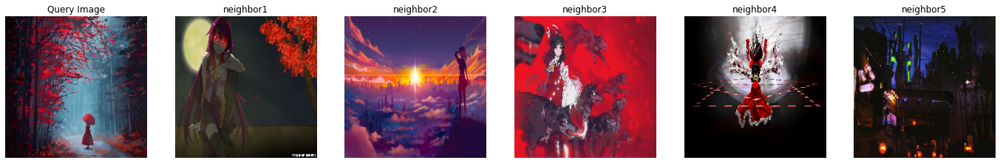

In [7]:
show_images(knn_images[50], '1')

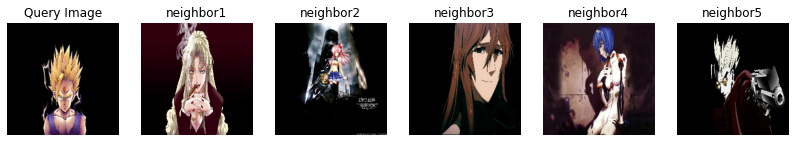

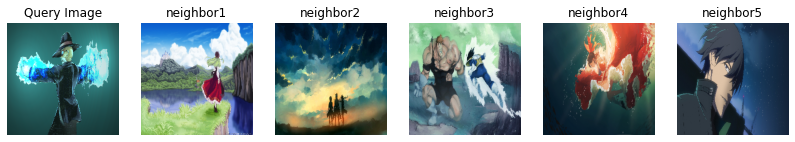

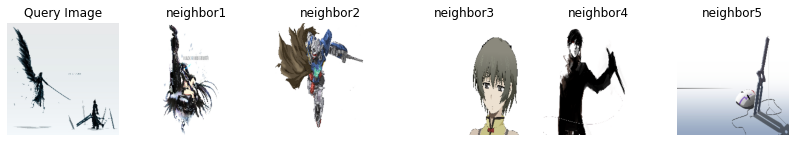

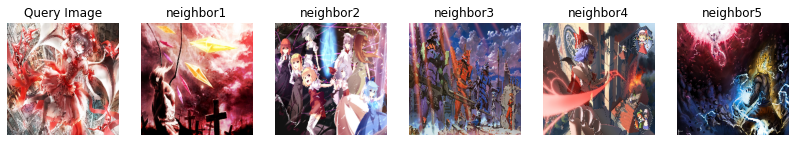

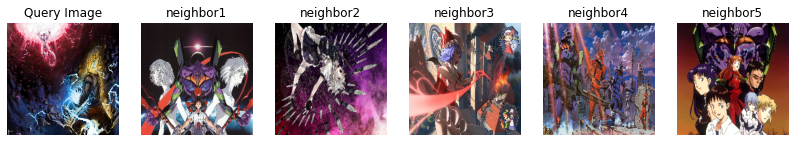

...

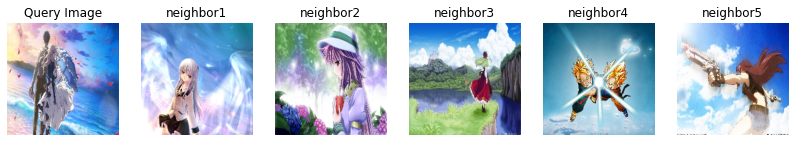

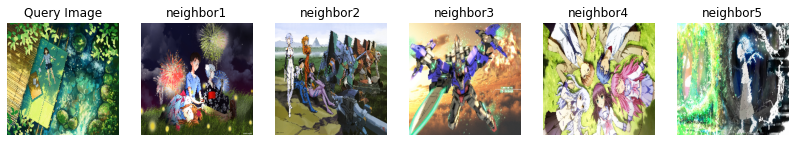

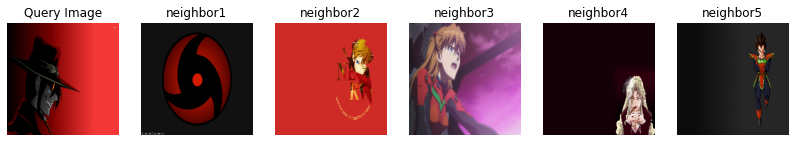

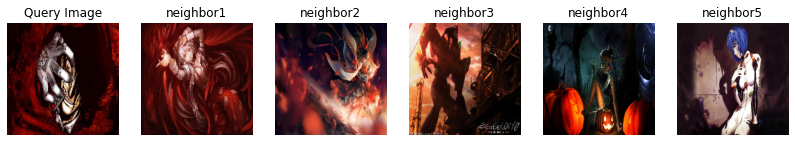

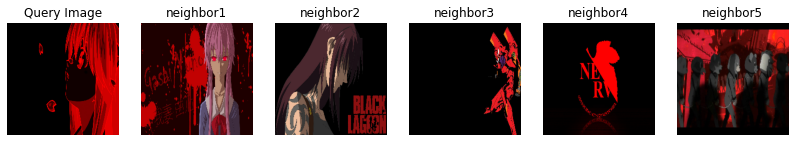

In [9]:
for i, img in enumerate(knn_images):
  show_images(img, str(i))